# Intel Image Classification

## Importing Libraries

In [11]:
# Imports
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.preprocessing import LabelEncoder
import random
import tensorflow as tf
from PIL import Image
import PIL.Image
from tensorflow.keras.models import Model,load_model
from tensorflow.keras.layers import  GlobalAveragePooling2D, Dropout, Dense, Flatten
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import  Adam
import matplotlib.image as mpimg
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.vgg16 import VGG16
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score


## Data load and Data visualization (Images)

Categories (6): ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

For training data:


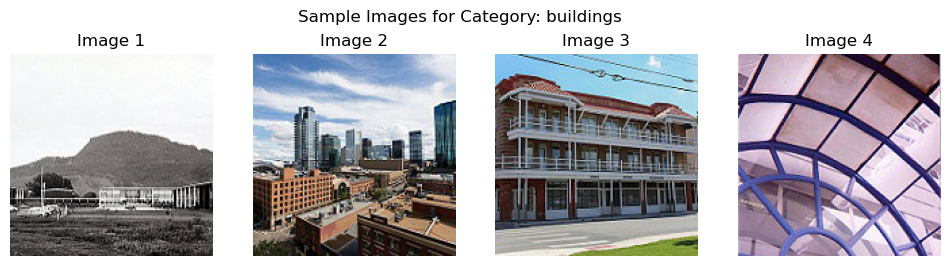

Number of images in buildings : 2191


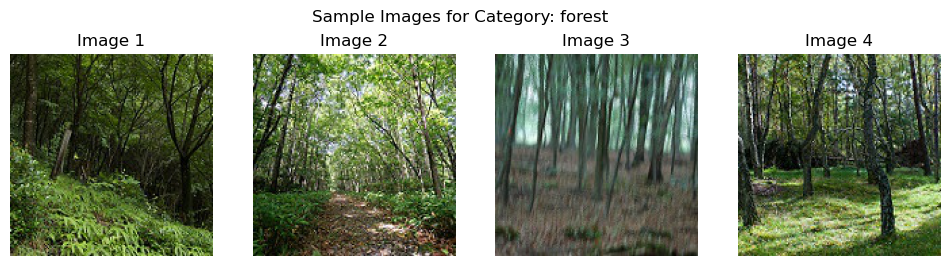

Number of images in forest : 2271


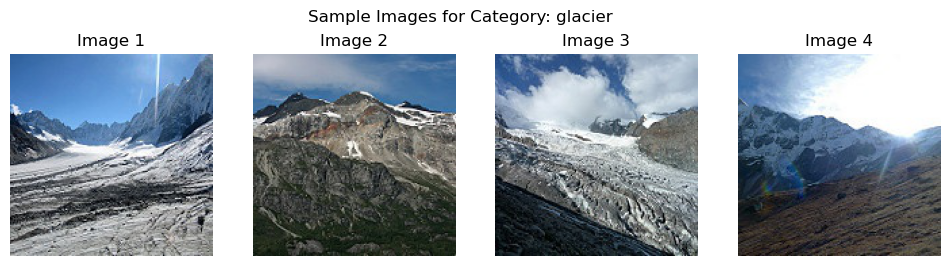

Number of images in glacier : 2404


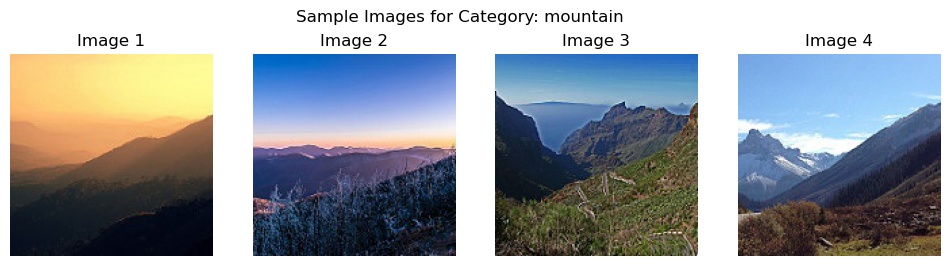

Number of images in mountain : 2512


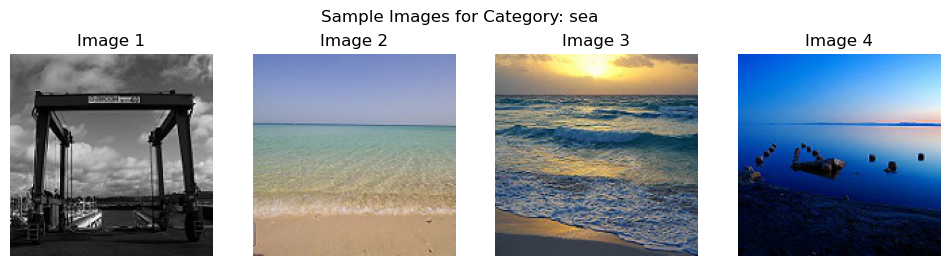

Number of images in sea : 2274


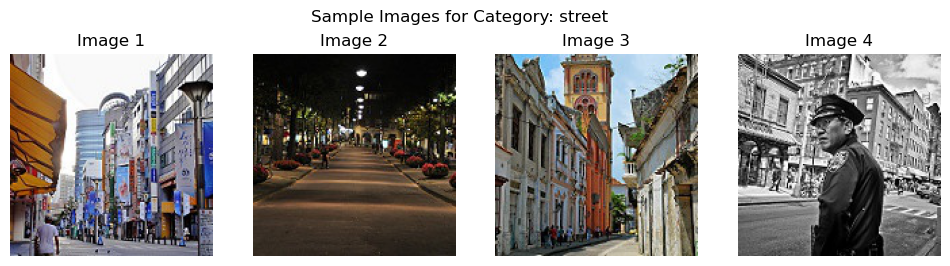

Number of images in street : 2382
Total number of images for training: 14034

--------------------------------------------------

For testing data:


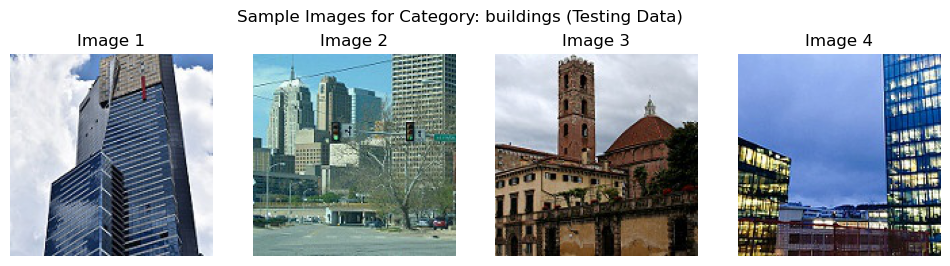

Number of images in buildings for testing data: 437


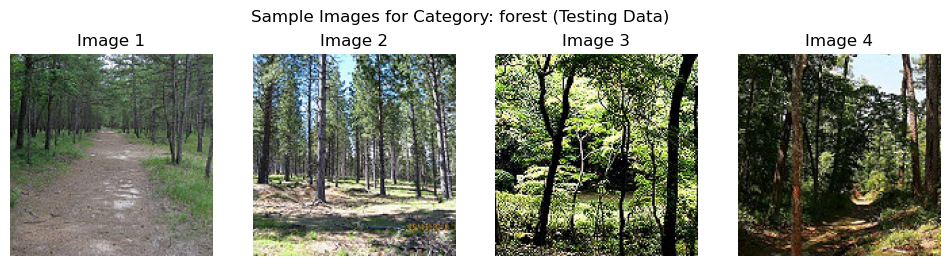

Number of images in forest for testing data: 474


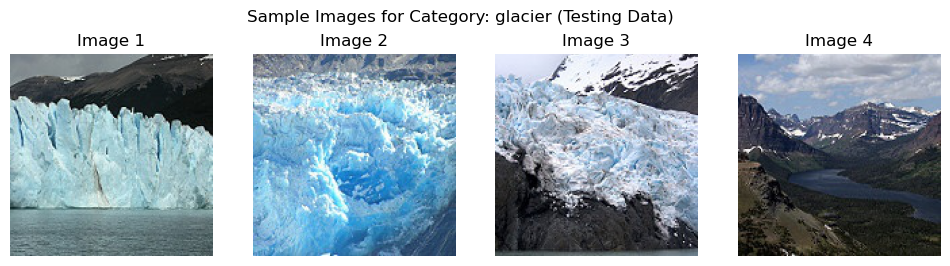

Number of images in glacier for testing data: 553


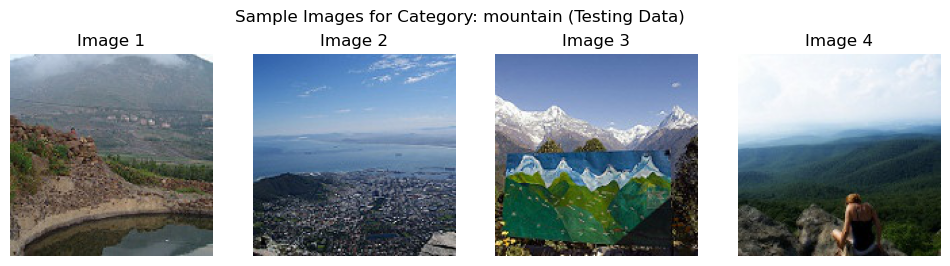

Number of images in mountain for testing data: 525


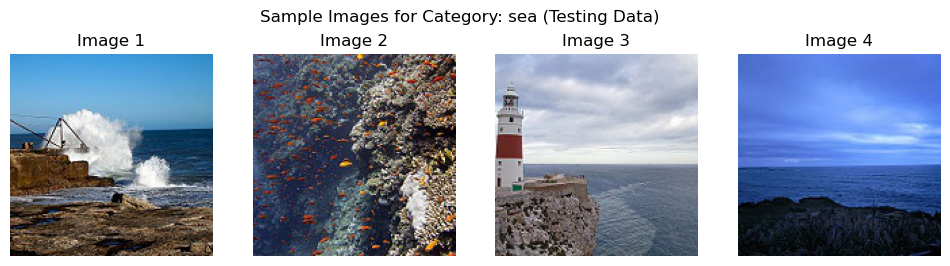

Number of images in sea for testing data: 510


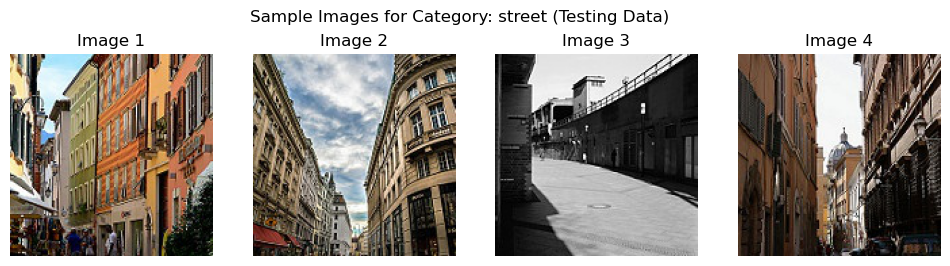

Number of images in street for testing data: 501
Total number of images for testing: 3000


In [5]:

# Define the paths to the training and testing data directories
Data_train = "seg_train/seg_train"
Data_test = "seg_test/seg_test"

# Get the list of all the categories (e.g., types of images)
categories = os.listdir(Data_train)

# Print the list of categories and the total number of categories
print("Categories (" + str(len(categories)) + "):", categories)

# Initialize lists to store the number of images in each category for training and testing data
train_counts = []
test_counts = []

# For training data
print("\nFor training data:")
# Initialize a variable to keep track of the total number of training images
total_train = 0

# Loop through each category to count the number of images in each category
for category in categories:
    # Get the list of image files in the current category
    category_path = os.path.join(Data_train, category)
    category_images = os.listdir(category_path)
    
    # Count the number of images in the current category
    num_images_in_category = len(category_images)
    
    # Display the first few images from each category for illustration
    num_to_display = min(4, num_images_in_category)
    plt.figure(figsize=(12, 3))
    plt.suptitle(f"Sample Images for Category: {category}")
    for i in range(num_to_display):
        image_path = os.path.join(category_path, category_images[i])
        img = mpimg.imread(image_path)
        plt.subplot(1, num_to_display, i + 1)
        plt.imshow(img)
        plt.title(f"Image {i + 1}")
        plt.axis('off')
    plt.show()
    
    # Print the category and the number of images in that category
    print("Number of images in", category, ":", num_images_in_category)
    
    # Update the total number of training images
    total_train += num_images_in_category

    # Store the count of images in the current category
    train_counts.append(num_images_in_category)

# Print the total number of training images
print("Total number of images for training:", total_train)

# Separator
print("\n--------------------------------------------------\n")

# For testing data
print("For testing data:")
# Initialize a variable to keep track of the total number of testing images
total_test = 0

# Loop through each category to count the number of images in each category for testing data
for category in categories:
    # Get the list of image files in the current category for testing data
    category_path = os.path.join(Data_test, category)
    category_images = os.listdir(category_path)
    
    # Count the number of images in the current category for testing data
    num_images_in_category = len(category_images)
    
    # Display the first few images from each category for illustration
    num_to_display = min(4, num_images_in_category)
    plt.figure(figsize=(12, 3))
    plt.suptitle(f"Sample Images for Category: {category} (Testing Data)")
    for i in range(num_to_display):
        image_path = os.path.join(category_path, category_images[i])
        img = mpimg.imread(image_path)
        plt.subplot(1, num_to_display, i + 1)
        plt.imshow(img)
        plt.title(f"Image {i + 1}")
        plt.axis('off')
    plt.show()
    
    # Print the category and the number of images in that category for testing data
    print("Number of images in", category, "for testing data:", num_images_in_category)
    
    # Update the total number of testing images
    total_test += num_images_in_category

    # Store the count of images in the current category for testing data
    test_counts.append(num_images_in_category)

# Print the total number of testing images
print("Total number of images for testing:", total_test)

## Data Visualization (Graphs)

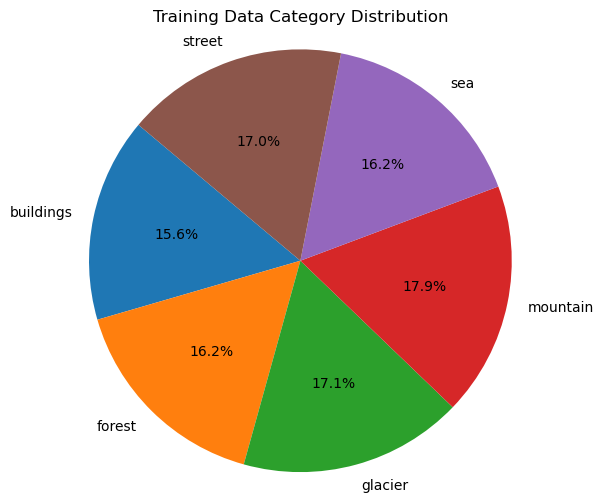

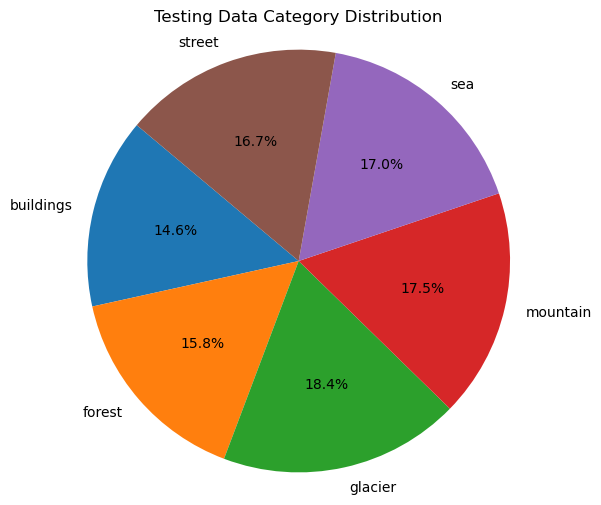

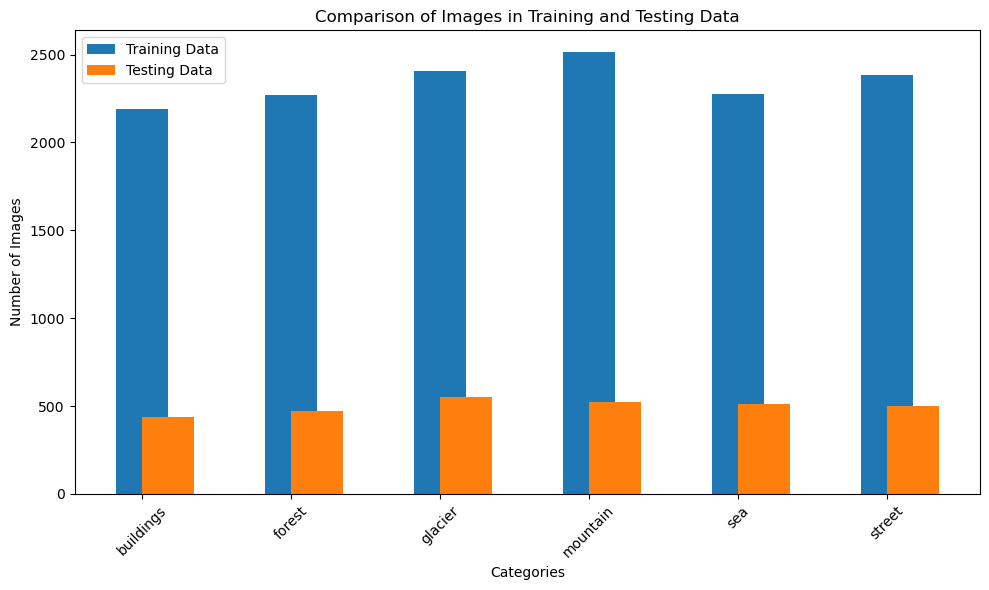

In [6]:
# Create a pie chart for training data
plt.figure(figsize=(6, 6))
plt.pie(train_counts, labels=categories, autopct='%1.1f%%', startangle=140)
plt.axis('equal')
plt.title('Training Data Category Distribution')
plt.show()

# Create a pie chart for testing data
plt.figure(figsize=(6, 6))
plt.pie(test_counts, labels=categories, autopct='%1.1f%%', startangle=140)
plt.axis('equal')
plt.title('Testing Data Category Distribution')
plt.show()

# Create a bar graph to compare the number of images between training and testing data
plt.figure(figsize=(10, 6))
width = 0.35
x = range(len(categories))
plt.bar(x, train_counts, width, label='Training Data', align='center')
plt.bar(x, test_counts, width, label='Testing Data', align='edge')
plt.xlabel('Categories')
plt.ylabel('Number of Images')
plt.title('Comparison of Images in Training and Testing Data')
plt.xticks(x, categories, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

## Label Encoding

In [7]:
# Label Encoding for the categories
le = LabelEncoder()
le.fit(categories)
print("Categories:", categories)
print("Encoded Labels:", le.transform(categories))


Categories: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Encoded Labels: [0 1 2 3 4 5]


## Data Preprocessing

In [8]:
# Data Preprocessing

# Create an ImageDataGenerator for training data with rescaling
train_datagen = ImageDataGenerator(rescale=1./255)

# Create an ImageDataGenerator for testing data with rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

# Create a generator for training data
train_generator = train_datagen.flow_from_directory(
        Data_train,             # Directory containing training data
        target_size=(150, 150),  # Target image size
        batch_size=32,           # Batch size
        color_mode="rgb",        # Color mode
        class_mode='categorical' # Type of labels (categorical for multi-class classification)
)

# Create a generator for testing data
test_generator = test_datagen.flow_from_directory(
        Data_test,               # Directory containing testing data
        target_size=(150, 150),  # Target image size
        batch_size=32,          # Batch size
        color_mode="rgb",        # Color mode
        class_mode='categorical' # Type of labels (categorical for multi-class classification)
)

# Load the next batch of training data images and their corresponding labels
train_images, train_labels = train_generator.next()

# Load the next batch of testing data images and their corresponding labels
test_images, test_labels = test_generator.next()


Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


## Hyperparameters

In [9]:
# Define hyperparameters1
hyperparameters1 = {
    'optimizer': 'SGD',
    'learning_rate': 0.001,
    'momentum': 0.9,
    'dense_units': 256,
    
}

# Define hyperparameters2
hyperparameters2 = {
    'optimizer': 'Adam',
    'learning_rate': 0.01,
    'momentum': 0.5,
    'dense_units': 64,
}

# Define hyperparameters3
hyperparameters3 = {
    'optimizer': 'Adam',
    'learning_rate': 0.001,
    'momentum': 0.9,
    'dense_units': 256,
}

## Implementing CNN Model

### Model ResNet50 (Residual Neural Network) - Hyperparameters1

In [68]:
# Load the ResNet50 model
model50_h1 = ResNet50(weights='imagenet', include_top=False, input_shape=(150, 150, 3), classes=6)


In [69]:
# Trainable parameters
for layer in model50_h1.layers:
    layer.trainable = True


In [70]:
# Define the optimizer
optimizer = SGD(lr=hyperparameters1['learning_rate'], momentum=hyperparameters1['momentum'])

# Define the model architecture
x = Flatten()(model50_h1.output)
x = Dense(hyperparameters1['dense_units'], activation='relu')(x)
x = Dense(6, activation='softmax')(x)
model50_h1 = Model(model50_h1.input, x)
model50_h1.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])


c:\Users\Rafael\anaconda3\envs\tf\lib\site-packages\keras\optimizers\optimizer_v2\gradient_descent.py:111: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [71]:
# Define callbacks for model checkpoint and early stopping
model_name = 'ResNet50_h1.h5'
callback_MC = ModelCheckpoint(filepath=model_name, monitor='val_acc', save_best_only=True, verbose=1,mode='max')
callback_ES = EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)

# Train the model
resnet50_hist_h1 = model50_h1.fit(
    train_generator,
    epochs=5,
    validation_data=test_generator,
    verbose=1,
    callbacks=[callback_MC, callback_ES]
)


Epoch 1/5
439/439 [==============================] - 872s 2s/step - loss: 0.3779 - accuracy: 0.8774 - val_loss: 2.0579 - val_accuracy: 0.2980
Epoch 2/5
439/439 [==============================] - 860s 2s/step - loss: 0.0953 - accuracy: 0.9668 - val_loss: 0.3931 - val_accuracy: 0.8677
Epoch 3/5
439/439 [==============================] - 867s 2s/step - loss: 0.0320 - accuracy: 0.9905 - val_loss: 0.3108 - val_accuracy: 0.9190
Epoch 4/5
439/439 [==============================] - 855s 2s/step - loss: 0.0187 - accuracy: 0.9954 - val_loss: 0.3175 - val_accuracy: 0.9207
Epoch 5/5
439/439 [==============================] - 860s 2s/step - loss: 0.0106 - accuracy: 0.9976 - val_loss: 0.3050 - val_accuracy: 0.9270


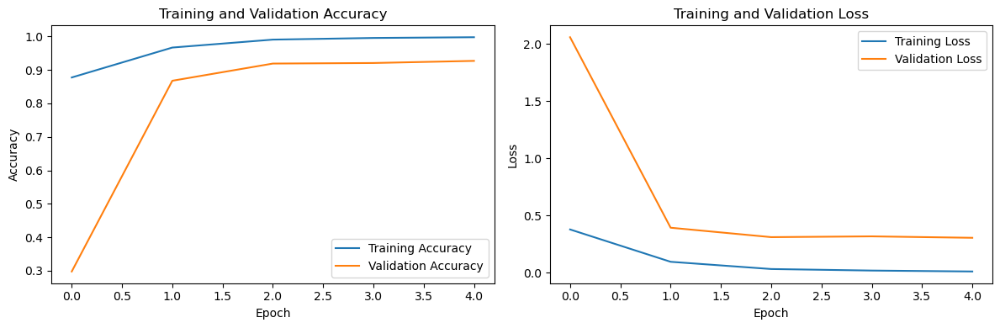

In [72]:
# Plot the training and validation accuracy and loss at each epoch
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(resnet50_hist_h1.history['accuracy'], label='Training Accuracy')
plt.plot(resnet50_hist_h1.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(resnet50_hist_h1.history['loss'], label='Training Loss')
plt.plot(resnet50_hist_h1.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()

# Save the model
model50_h1.save('ResNet50_h1.h5')

1/1 [==============================] - 1s 1s/step


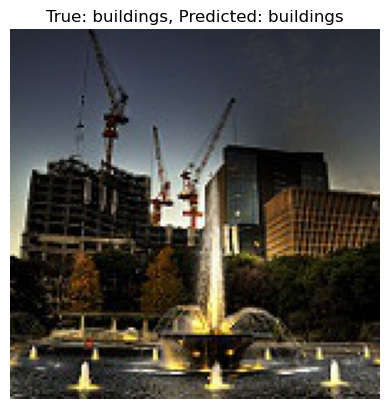

1/1 [==============================] - 0s 67ms/step


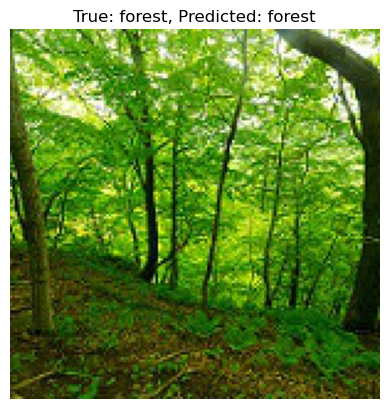

1/1 [==============================] - 0s 66ms/step


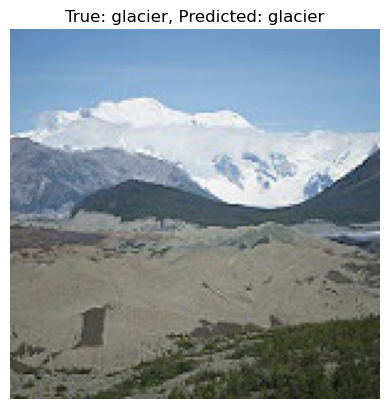

1/1 [==============================] - 0s 66ms/step


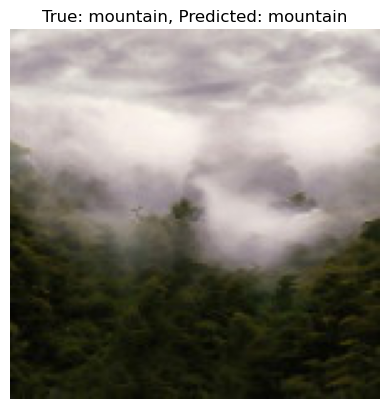

1/1 [==============================] - 0s 59ms/step


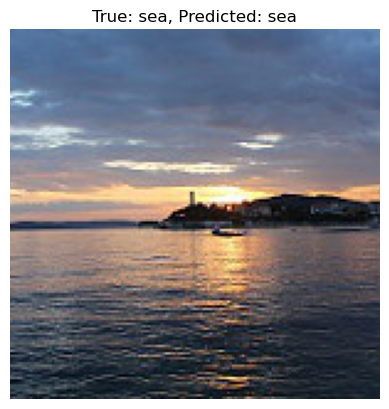

1/1 [==============================] - 0s 69ms/step


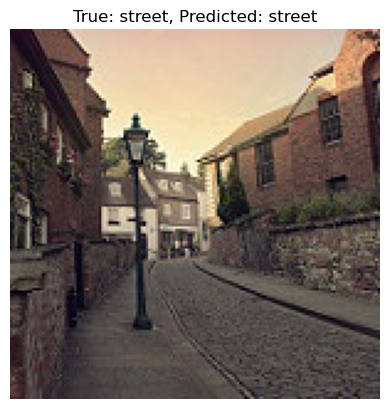

In [73]:
# Load the trained ResNet50 model
model = load_model('ResNet50_h1.h5')

# Initialize a list to store the category names and corresponding image file names
image_samples = []

# Randomly select 5 images from different categories
for category in categories:
    category_path = os.path.join(Data_test, category)
    category_images = os.listdir(category_path)
    
    if len(category_images) > 0:
        # Randomly select an image from the category
        random_image = np.random.choice(category_images)
        image_path = os.path.join(category_path, random_image)
        image_samples.append((category, image_path))

# Create a function to predict and display the image
def predict_and_display_image(model, category, image_path):
    img = image.load_img(image_path, target_size=(150, 150))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = img / 255.0  # Rescale the image
    prediction = model.predict(img)
    predicted_category = categories[np.argmax(prediction)]

    plt.figure()
    plt.imshow(mpimg.imread(image_path))
    plt.title(f"True: {category}, Predicted: {predicted_category}")
    plt.axis('off')
    plt.show()

# Predict and display the selected images
for category, image_path in image_samples:
    predict_and_display_image(model, category, image_path)

### Model ResNet50 (Residual Neural Network) - Hyperparameters2

In [74]:
from tensorflow.keras.applications.resnet50 import ResNet50

# Load the ResNet50 model
model50_h2 = ResNet50(weights='imagenet', include_top=False, input_shape=(150, 150, 3), classes=6)


In [75]:
# Trainable parameters
for layer in model50_h2.layers:
    layer.trainable = True


In [76]:
# Define the optimizer
optimizer = Adam(lr=hyperparameters2['learning_rate'], beta_1=hyperparameters2['momentum'])

# Define the model architecture
x = Flatten()(model50_h2.output)
x = Dense(hyperparameters2['dense_units'], activation='relu')(x)
x = Dense(6, activation='softmax')(x)
model50_h2 = Model(model50_h2.input, x)
model50_h2.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])


c:\Users\Rafael\anaconda3\envs\tf\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [77]:
# Define callbacks for model checkpoint and early stopping
model_name = 'ResNet50_h2.h5'
callback_MC = ModelCheckpoint(filepath=model_name, monitor='val_acc', save_best_only=True, verbose=1,mode='max')
callback_ES = EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)

# Train the model
resnet50_hist_h2 = model50_h2.fit(
    train_generator,
    epochs=5,
    validation_data=test_generator,
    verbose=1,
    callbacks=[callback_MC, callback_ES]
)


Epoch 1/5
439/439 [==============================] - 902s 2s/step - loss: 2.2001 - accuracy: 0.3948 - val_loss: 2.9269 - val_accuracy: 0.1843
Epoch 2/5
439/439 [==============================] - 889s 2s/step - loss: 1.1501 - accuracy: 0.5413 - val_loss: 1.1584 - val_accuracy: 0.5113
Epoch 3/5
439/439 [==============================] - 892s 2s/step - loss: 1.4200 - accuracy: 0.5405 - val_loss: 1.7023 - val_accuracy: 0.3397
Epoch 4/5
439/439 [==============================] - 890s 2s/step - loss: 1.0598 - accuracy: 0.5921 - val_loss: 0.9289 - val_accuracy: 0.6383
Epoch 5/5
439/439 [==============================] - 885s 2s/step - loss: 0.9824 - accuracy: 0.6150 - val_loss: 0.9710 - val_accuracy: 0.6060


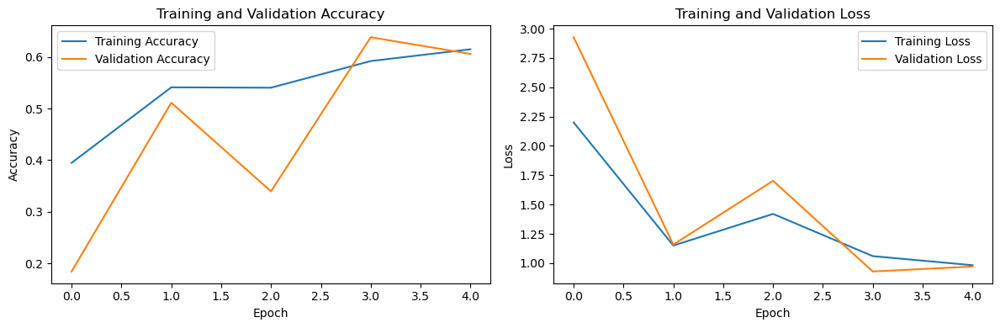

In [78]:
# Plot the training and validation accuracy and loss at each epoch
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(resnet50_hist_h2.history['accuracy'], label='Training Accuracy')
plt.plot(resnet50_hist_h2.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(resnet50_hist_h2.history['loss'], label='Training Loss')
plt.plot(resnet50_hist_h2.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()

# Save the model
model50_h2.save('ResNet50_h2.h5')

1/1 [==============================] - 1s 1s/step


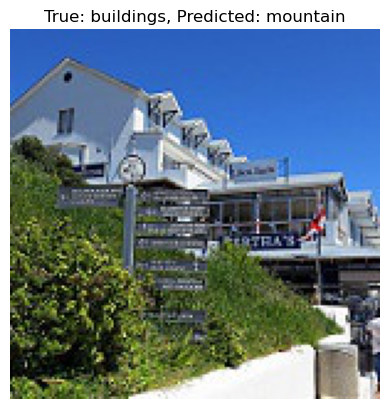

1/1 [==============================] - 0s 62ms/step


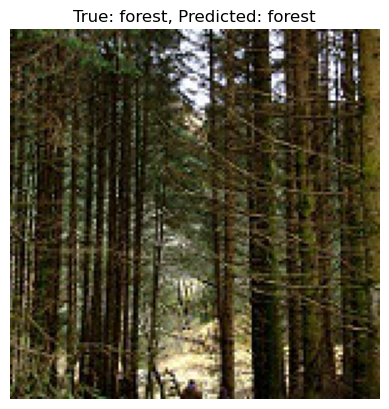

1/1 [==============================] - 0s 61ms/step


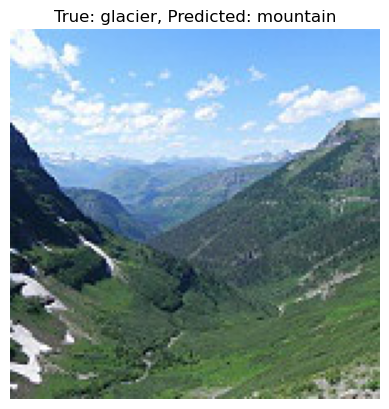

1/1 [==============================] - 0s 61ms/step


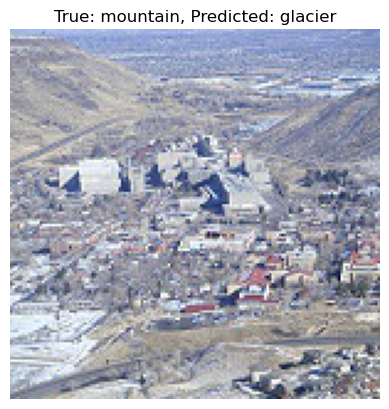

1/1 [==============================] - 0s 59ms/step


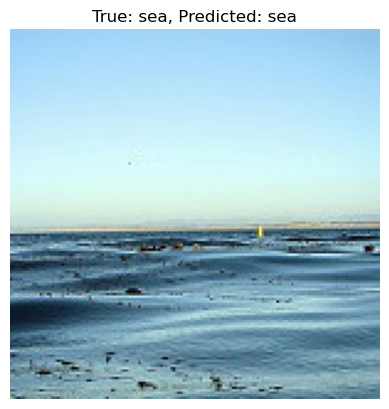

1/1 [==============================] - 0s 57ms/step


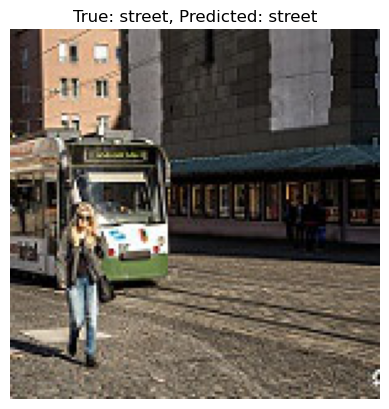

In [79]:
# Load the trained ResNet50 model
model = load_model('ResNet50_h2.h5')

# Initialize a list to store the category names and corresponding image file names
image_samples = []

# Randomly select 5 images from different categories
for category in categories:
    category_path = os.path.join(Data_test, category)
    category_images = os.listdir(category_path)
    
    if len(category_images) > 0:
        # Randomly select an image from the category
        random_image = np.random.choice(category_images)
        image_path = os.path.join(category_path, random_image)
        image_samples.append((category, image_path))

# Create a function to predict and display the image
def predict_and_display_image(model, category, image_path):
    img = image.load_img(image_path, target_size=(150, 150))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = img / 255.0  # Rescale the image
    prediction = model.predict(img)
    predicted_category = categories[np.argmax(prediction)]

    plt.figure()
    plt.imshow(mpimg.imread(image_path))
    plt.title(f"True: {category}, Predicted: {predicted_category}")
    plt.axis('off')
    plt.show()

# Predict and display the selected images
for category, image_path in image_samples:
    predict_and_display_image(model, category, image_path)

### Model ResNet50 (Residual Neural Network) - Hyperparameters3

In [7]:
# Load the ResNet50 model
model50_h3 = ResNet50(weights='imagenet', include_top=False, input_shape=(150, 150, 3), classes=6)


In [8]:
# Trainable parameters
for layer in model50_h3.layers:
    layer.trainable = True


In [10]:
# Define the optimizer
optimizer = Adam(lr=hyperparameters3['learning_rate'], beta_1=hyperparameters3['momentum'])

# Define the model architecture
x = Flatten()(model50_h3.output)
x = Dense(hyperparameters3['dense_units'], activation='relu')(x)
x = Dense(6, activation='softmax')(x)
model50_h3 = Model(model50_h3.input, x)
model50_h3.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])


In [11]:
# Define callbacks for model checkpoint and early stopping
model_name = 'ResNet50_h3.h5'
callback_MC = ModelCheckpoint(filepath=model_name, monitor='val_acc', save_best_only=True, verbose=1,mode='max')
callback_ES = EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)

# Train the model
resnet50_hist_h3 = model50_h3.fit(
    train_generator,
    epochs=5,
    validation_data=test_generator,
    verbose=1,
    callbacks=[callback_MC, callback_ES]
)


Epoch 1/5
439/439 [==============================] - 946s 2s/step - loss: 0.8716 - accuracy: 0.7910 - val_loss: 4.1143 - val_accuracy: 0.1730
Epoch 2/5
439/439 [==============================] - 932s 2s/step - loss: 0.4619 - accuracy: 0.8576 - val_loss: 6.9439 - val_accuracy: 0.6587
Epoch 3/5
439/439 [==============================] - 938s 2s/step - loss: 0.3781 - accuracy: 0.8694 - val_loss: 1.1311 - val_accuracy: 0.7690
Epoch 4/5
439/439 [==============================] - 940s 2s/step - loss: 0.4001 - accuracy: 0.8674 - val_loss: 1.2375 - val_accuracy: 0.6490
Epoch 5/5
439/439 [==============================] - 943s 2s/step - loss: 0.2946 - accuracy: 0.9009 - val_loss: 0.6578 - val_accuracy: 0.7880


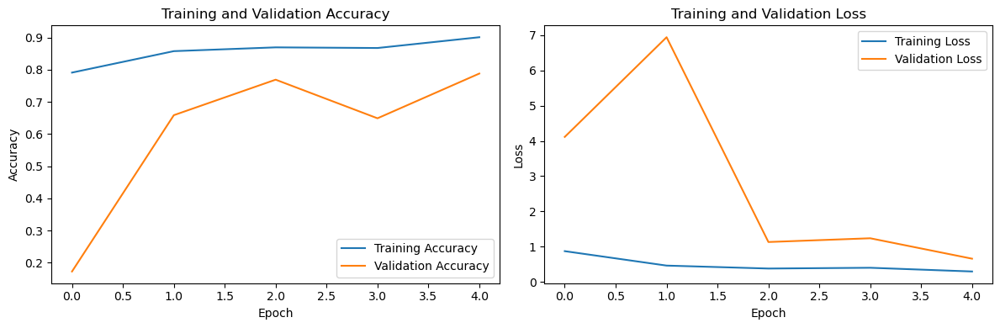

In [12]:
# Plot the training and validation accuracy and loss at each epoch
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(resnet50_hist_h3.history['accuracy'], label='Training Accuracy')
plt.plot(resnet50_hist_h3.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(resnet50_hist_h3.history['loss'], label='Training Loss')
plt.plot(resnet50_hist_h3.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()

# Save the model
model50_h3.save('ResNet50_h3.h5')

1/1 [==============================] - 1s 1s/step


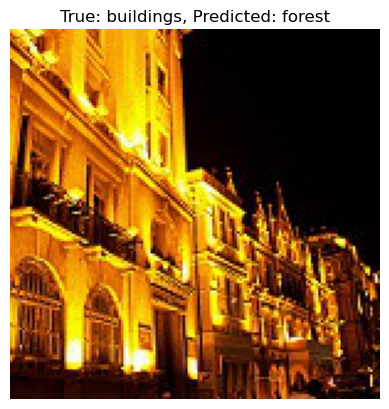

1/1 [==============================] - 0s 66ms/step


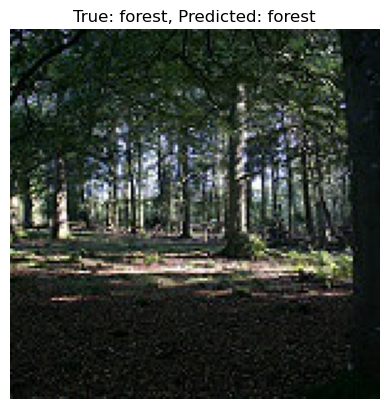

1/1 [==============================] - 0s 71ms/step


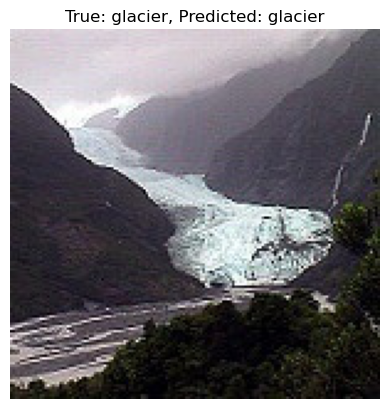

1/1 [==============================] - 0s 67ms/step


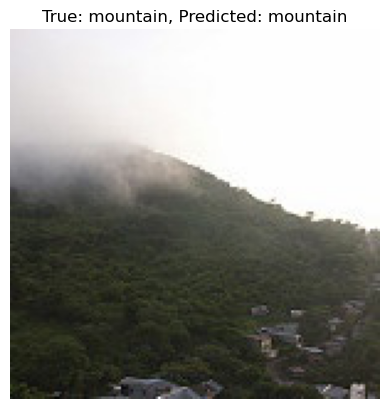

1/1 [==============================] - 0s 72ms/step


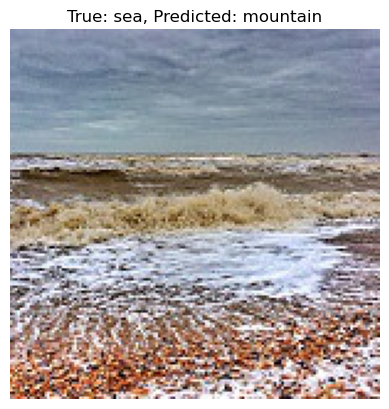

1/1 [==============================] - 0s 65ms/step


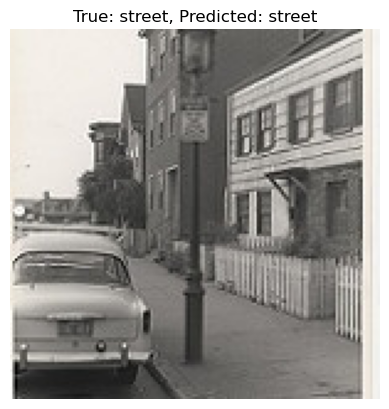

In [13]:
# Load the trained ResNet50 model
model = load_model('ResNet50_h3.h5')

# Initialize a list to store the category names and corresponding image file names
image_samples = []

# Randomly select 5 images from different categories
for category in categories:
    category_path = os.path.join(Data_test, category)
    category_images = os.listdir(category_path)
    
    if len(category_images) > 0:
        # Randomly select an image from the category
        random_image = np.random.choice(category_images)
        image_path = os.path.join(category_path, random_image)
        image_samples.append((category, image_path))

# Create a function to predict and display the image
def predict_and_display_image(model, category, image_path):
    img = image.load_img(image_path, target_size=(150, 150))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = img / 255.0  # Rescale the image
    prediction = model.predict(img)
    predicted_category = categories[np.argmax(prediction)]

    plt.figure()
    plt.imshow(mpimg.imread(image_path))
    plt.title(f"True: {category}, Predicted: {predicted_category}")
    plt.axis('off')
    plt.show()

# Predict and display the selected images
for category, image_path in image_samples:
    predict_and_display_image(model, category, image_path)

### Model VGG16 (Visual Geometry Group)

In [23]:
# Load the VGG16 model
model16 = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3), classes=6)

In [24]:
# Trainable parameters
for layer in model16.layers:
    layer.trainable = False

In [25]:
# Define the optimizer
optimizer = SGD(hyperparameters1['learning_rate'], momentum=hyperparameters1['momentum'])

# Define the model architecture
x = Flatten()(model16.output)
x = Dense(256, activation='relu')(x)
x = Dense(6, activation='softmax')(x)
model16 = Model(model16.input, x)
model16.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

In [26]:
# Define callbacks for model checkpoint and early stopping
model_name = 'VGG16.h5'
callback_MC = ModelCheckpoint(filepath=model_name, monitor='val_acc', save_best_only=True, verbose=1,mode='max')
callback_ES = EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)

# Train the model
vgg16_hist = model16.fit(
    train_generator,
    epochs=5,
    validation_data=test_generator,
    verbose=1,
    callbacks=[callback_MC, callback_ES]
)

Epoch 1/5
439/439 [==============================] - 692s 2s/step - loss: 0.5824 - accuracy: 0.7812 - val_loss: 0.4313 - val_accuracy: 0.8407
Epoch 2/5
439/439 [==============================] - 584s 1s/step - loss: 0.3950 - accuracy: 0.8544 - val_loss: 0.4499 - val_accuracy: 0.8357
Epoch 3/5
439/439 [==============================] - 605s 1s/step - loss: 0.3626 - accuracy: 0.8655 - val_loss: 0.3761 - val_accuracy: 0.8593
Epoch 4/5
439/439 [==============================] - 615s 1s/step - loss: 0.3428 - accuracy: 0.8731 - val_loss: 0.3482 - val_accuracy: 0.8760
Epoch 5/5
439/439 [==============================] - 614s 1s/step - loss: 0.3130 - accuracy: 0.8834 - val_loss: 0.3485 - val_accuracy: 0.8700


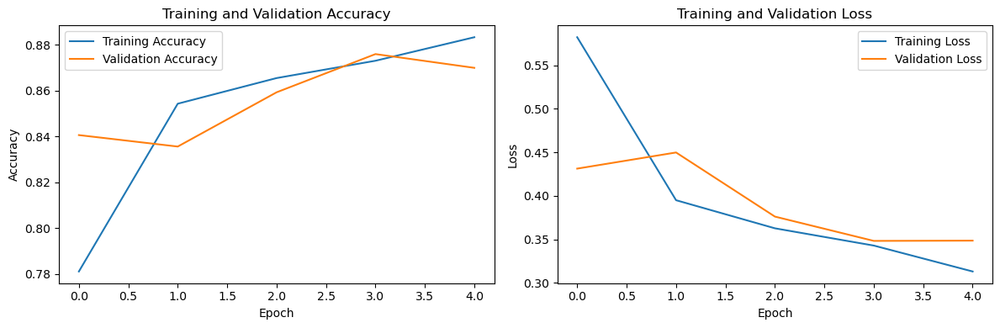

In [28]:
# Plot the training and validation accuracy and loss at each epoch
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(vgg16_hist.history['accuracy'], label='Training Accuracy')
plt.plot(vgg16_hist.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(vgg16_hist.history['loss'], label='Training Loss')
plt.plot(vgg16_hist.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()

# Save the model
model16.save('VGG16.h5')

1/1 [==============================] - 1s 668ms/step


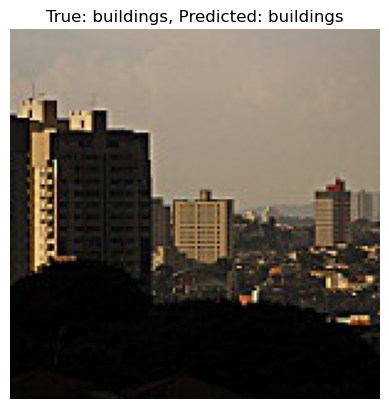

1/1 [==============================] - 0s 176ms/step


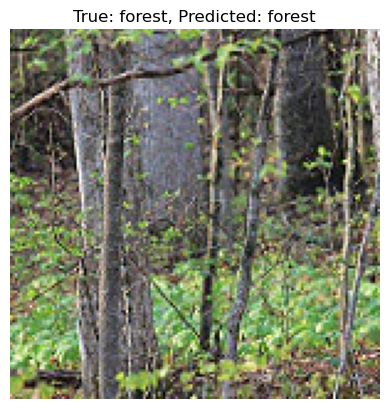

1/1 [==============================] - 0s 141ms/step


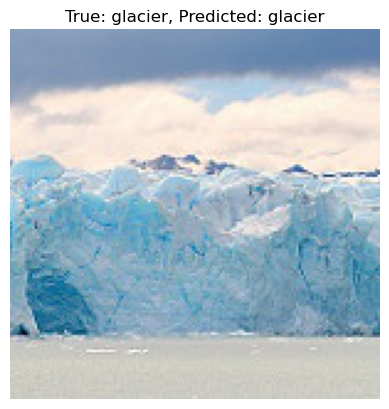

1/1 [==============================] - 0s 182ms/step


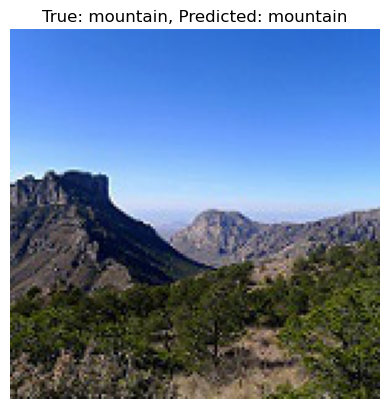

1/1 [==============================] - 0s 175ms/step


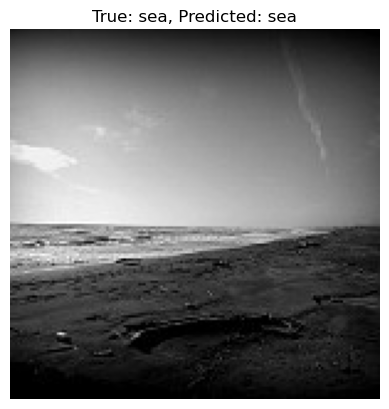

1/1 [==============================] - 0s 122ms/step


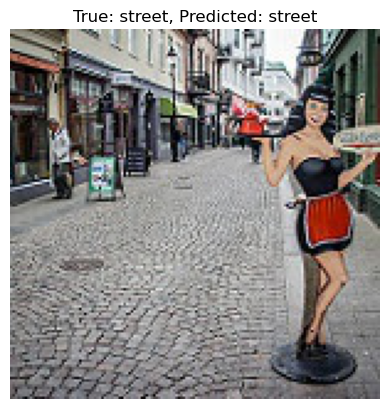

In [15]:
# Load the trained ResNet50 model
model = load_model('VGG16.h5')

# Initialize a list to store the category names and corresponding image file names
image_samples = []

# Randomly select 5 images from different categories
for category in categories:
    category_path = os.path.join(Data_test, category)
    category_images = os.listdir(category_path)
    
    if len(category_images) > 0:
        # Randomly select an image from the category
        random_image = np.random.choice(category_images)
        image_path = os.path.join(category_path, random_image)
        image_samples.append((category, image_path))

# Create a function to predict and display the image
def predict_and_display_image(model, category, image_path):
    img = image.load_img(image_path, target_size=(150, 150))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = img / 255.0  # Rescale the image
    prediction = model.predict(img)
    predicted_category = categories[np.argmax(prediction)]

    plt.figure()
    plt.imshow(mpimg.imread(image_path))
    plt.title(f"True: {category}, Predicted: {predicted_category}")
    plt.axis('off')
    plt.show()

# Predict and display the selected images
for category, image_path in image_samples:
    predict_and_display_image(model, category, image_path)

### Comparing Models

Found 3000 images belonging to 6 classes.
Classification Report - ResNet50_h1:
               precision    recall  f1-score   support

   buildings       0.93      0.92      0.92       437
      forest       0.98      0.99      0.99       474
     glacier       0.87      0.89      0.88       553
    mountain       0.89      0.88      0.88       525
         sea       0.97      0.94      0.96       510
      street       0.93      0.95      0.94       501

    accuracy                           0.93      3000
   macro avg       0.93      0.93      0.93      3000
weighted avg       0.93      0.93      0.93      3000

Classification Report - ResNet50_h2:
               precision    recall  f1-score   support

   buildings       0.67      0.57      0.62       437
      forest       0.73      0.86      0.79       474
     glacier       0.51      0.60      0.55       553
    mountain       0.50      0.74      0.59       525
         sea       0.58      0.23      0.33       510
      street  

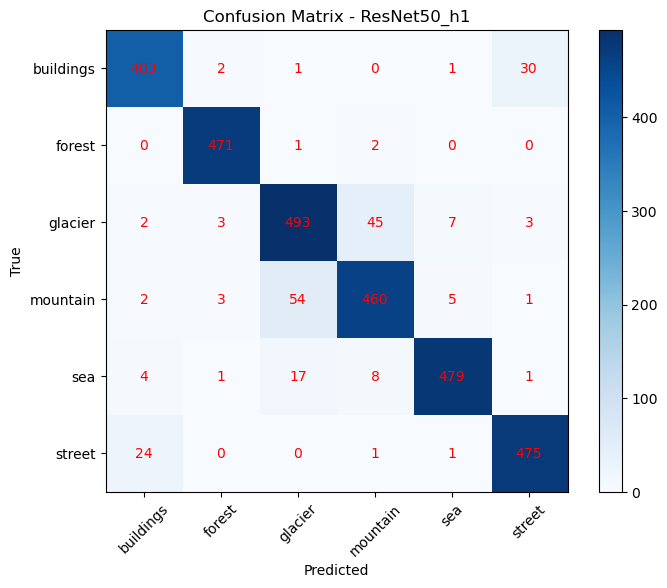

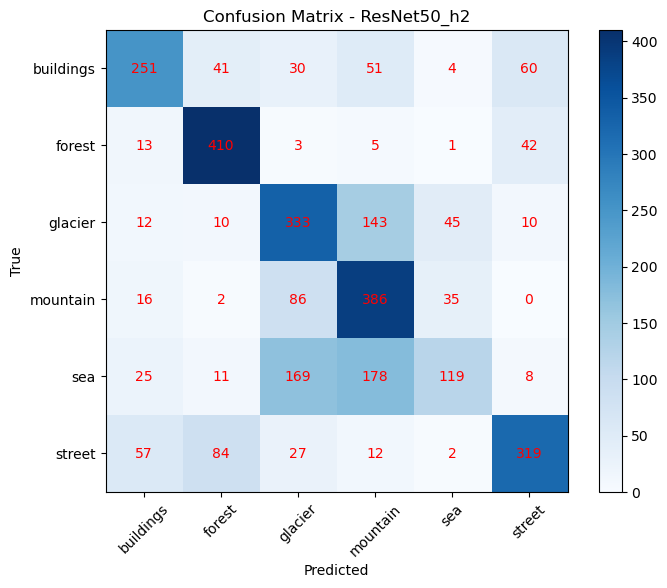

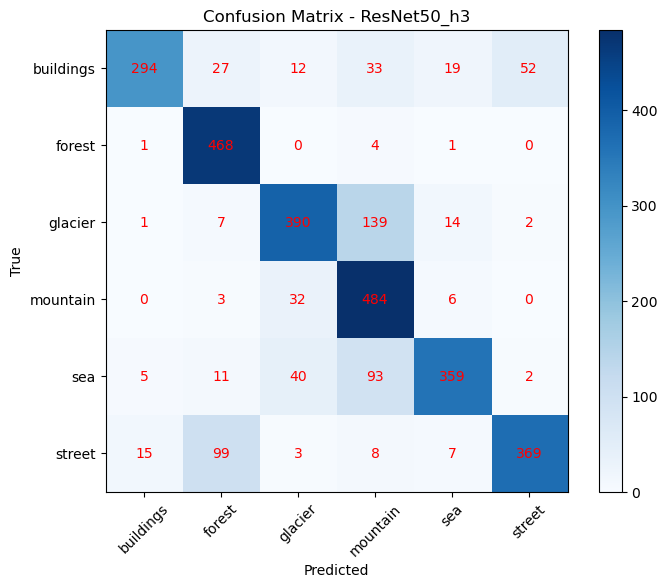

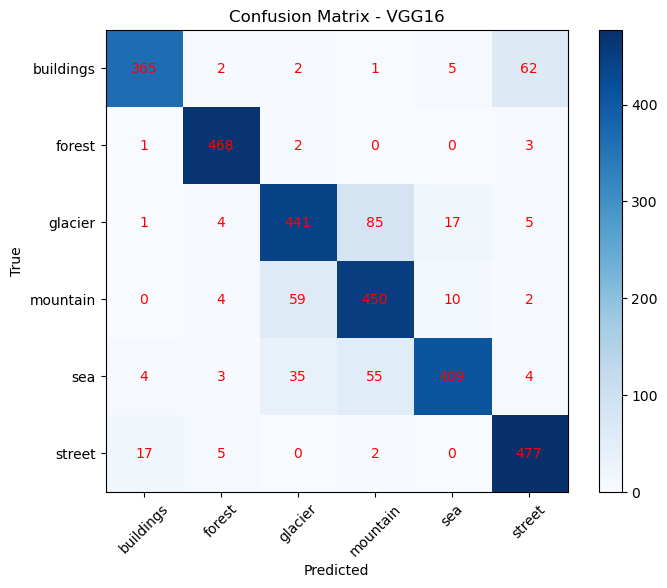

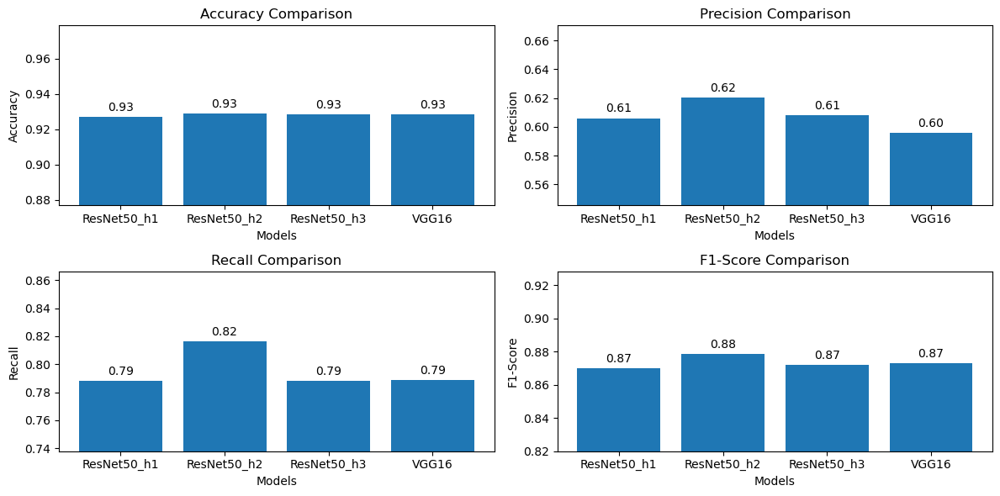

In [18]:
def evaluate_and_compare_models(model_paths, model_names, test_generator, categories):
    # Initialize lists to store metrics
    accuracies = []
    precisions = []
    recalls = []
    f1_scores = []

    # Create a function to calculate metrics and store them
    def calculate_metrics(model, model_name):
        predictions = model.predict(test_generator, verbose=0)
        predicted_labels = predictions.argmax(axis=1)

        # Calculate accuracy
        accuracy = accuracy_score(true_labels, predicted_labels)
        accuracies.append(accuracy)

        # Calculate precision, recall, and F1-score
        report = classification_report(true_labels, predicted_labels, target_names=categories, output_dict=True)
        precision = np.mean([report[category]['precision'] for category in categories])
        recall = np.mean([report[category]['recall'] for category in categories])
        f1_score = np.mean([report[category]['f1-score'] for category in categories])

        precisions.append(precision)
        recalls.append(recall)
        f1_scores.append(f1_score)

    # Load models and evaluate
    for model_path, model_name in zip(model_paths, model_names):
        model = load_model(model_path)

        # Predict using the model
        predictions = model.predict(test_generator, verbose=0)
        predicted_labels = predictions.argmax(axis=1)

        # Generate confusion matrix
        cm = confusion_matrix(true_labels, predicted_labels)

        # Plot confusion matrix
        plt.figure(figsize=(8, 6))
        plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix - {model_name}')
        plt.colorbar()
        tick_marks = range(len(categories))
        plt.xticks(tick_marks, categories, rotation=45)
        plt.yticks(tick_marks, categories)
        plt.xlabel('Predicted')
        plt.ylabel('True')
        for i in range(len(categories)):
            for j in range(len(categories)):
                plt.text(j, i, str(cm[i, j]), ha='center', va='center', color='red')

        # Generate classification report
        report = classification_report(true_labels, predicted_labels, target_names=categories)

        # Print classification report
        print(f'Classification Report - {model_name}:\n', report)

        # Calculate metrics for each model
        calculate_metrics(model, model_name)

    # Create a bar graph to compare models
    metrics = ["Accuracy", "Precision", "Recall", "F1-Score"]
    metric_values = [accuracies, precisions, recalls, f1_scores]

    plt.figure(figsize=(12, 6))

    for i, metric in enumerate(metrics):
        plt.subplot(2, 2, i + 1)
        bars = plt.bar(model_names, [values[i] for values in metric_values])
        plt.title(f"{metric} Comparison")
        plt.xlabel("Models")
        plt.ylabel(metric)
        plt.ylim(min([values[i] for values in metric_values]) - 0.05, max([values[i] for values in metric_values]) + 0.05)

        # Annotate the bars with their values
        for bar in bars:
            height = bar.get_height()
            plt.annotate(f'{height:.2f}', xy=(bar.get_x() + bar.get_width() / 2, height), xytext=(0, 3),
                    textcoords="offset points", ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

# Define model paths and names
model_paths = ['ResNet50_h1.h5', 'ResNet50_h2.h5', 'ResNet50_h3.h5', 'VGG16.h5']
model_names = ['ResNet50_h1', 'ResNet50_h2', 'ResNet50_h3', 'VGG16']

# Test_generator
test_generator = test_datagen.flow_from_directory(
        Data_test,               # Directory containing testing data
        target_size=(150, 150),  # Target image size
        batch_size=32,          # Batch size
        color_mode="rgb",        # Color mode
        class_mode='categorical', # Type of labels (categorical for multi-class classification)
        shuffle = False
)

# Get the true labels
true_labels = test_generator.classes

# Call the function to evaluate and compare models
evaluate_and_compare_models(model_paths, model_names, test_generator, categories)